# Collect Images Using OpenCV

In [30]:
import os
import time
import uuid
import cv2

In [31]:
uuid.uuid1()

UUID('769cb7d7-38ab-11f0-871b-dc215c47df69')

In [32]:
IMAGES_PATH = os.path.join('facedata','images')
number_images = 30

In [22]:
cap = cv2.VideoCapture(0)
for imgnum in range(number_images):
    print('Collecting image {}'.format(imgnum))
    ret, frame = cap.read()
    if not ret:
        print("Failed to grab frame")
        break
    imgname = os.path.join(IMAGES_PATH, f'{str(uuid.uuid1())}.jpg')
    cv2.imwrite(imgname, frame)
    # cv2.imshow('frame', frame)  # Remove this
    time.sleep(0.5)

    # if cv2.waitKey(1) & 0xFF == ord('q'):  # Remove this
    #     break

cap.release()
# cv2.destroyAllWindows()  # Remove this

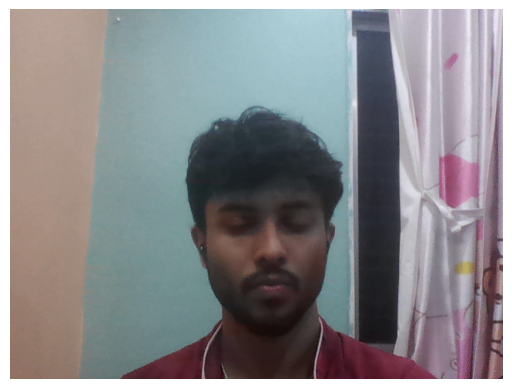

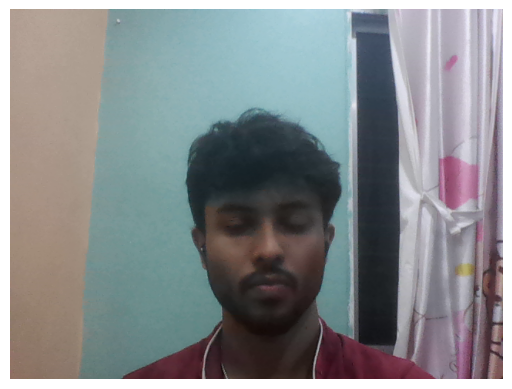

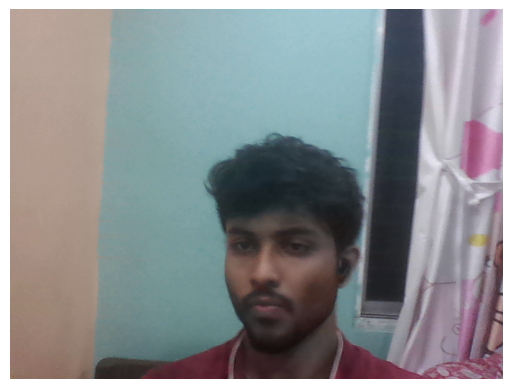

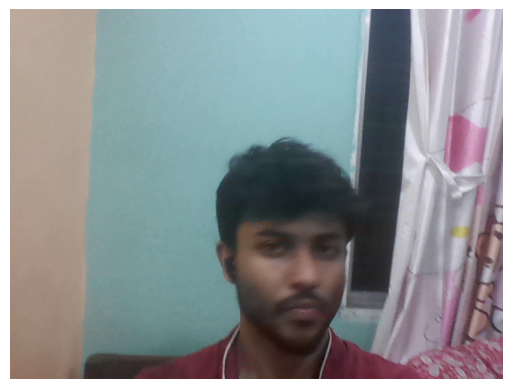

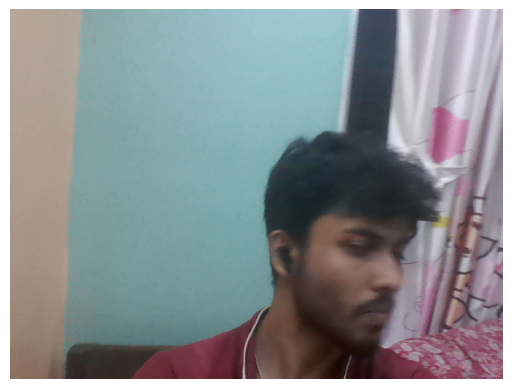

...

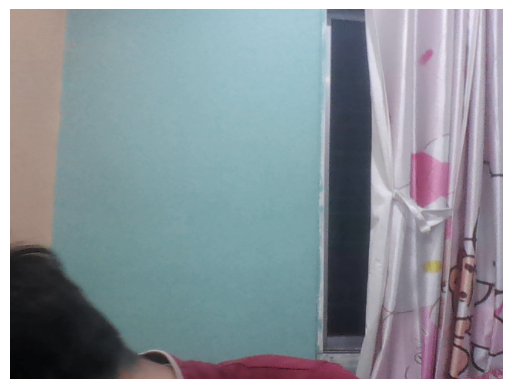

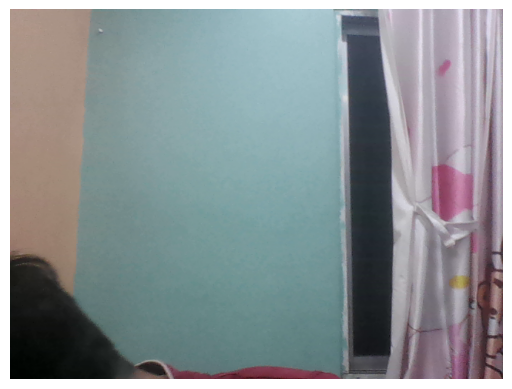

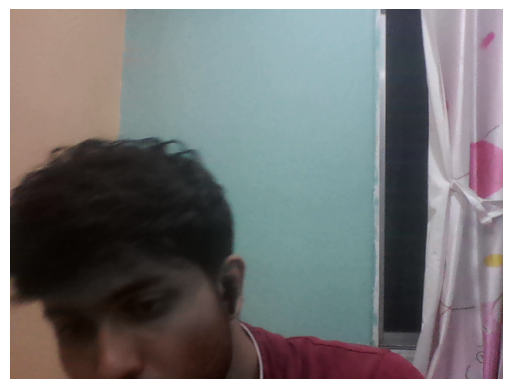

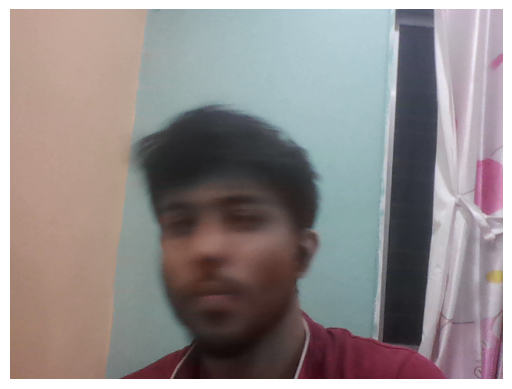

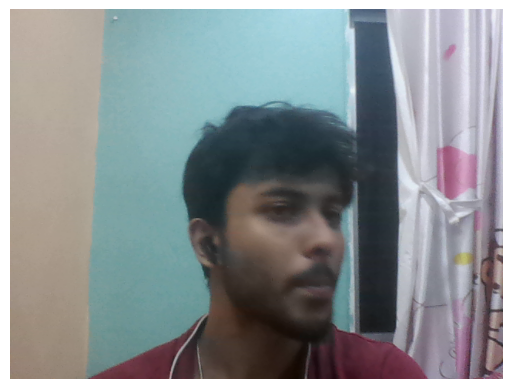

In [24]:
import cv2
import os
import time
import uuid
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(0)
for imgnum in range(number_images):
    print('Collecting image {}'.format(imgnum))
    ret, frame = cap.read()
    if not ret:
        print("Failed to grab frame")
        break
    imgname = os.path.join(IMAGES_PATH, f'{str(uuid.uuid1())}.jpg')
    cv2.imwrite(imgname, frame)
    
    # Show the image inline
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    
    time.sleep(0.5)
cap.release()

# Review Dataset and Build Image Loading function

In [15]:
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt

In [16]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [17]:
tf.config.list_physical_devices('GPU')

[]

In [ ]:
## Load Image in Pipeline

In [21]:
images = tf.data.Dataset.list_files('facedata/images/*.jpg')

InvalidArgumentError: Expected 'tf.Tensor(False, shape=(), dtype=bool)' to be true. Summarized data: b'No files matched pattern: facedata/images/*.jpg'

In [22]:
images.as_numpy_iterator().next()

NameError: name 'images' is not defined

In [18]:
def load_image(x): 
    byte_img = tf.io.read_file(x)
    img = tf.io.decode_jpeg(byte_img)
    return img

In [19]:
images = images.map(load_image)

NameError: name 'images' is not defined

In [23]:
images.as_numpy_iterator().next()

NameError: name 'images' is not defined

In [10]:
type(images)

tensorflow.python.data.ops.map_op._MapDataset

In [11]:
## View Raw Images in Matplotlib

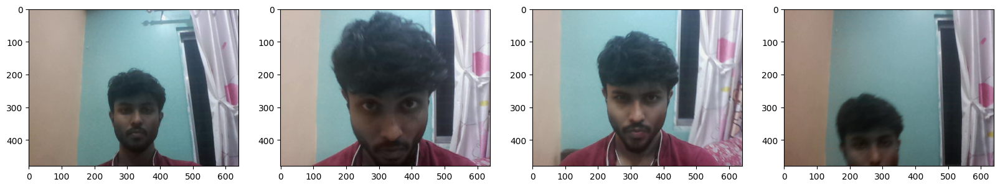

In [12]:
image_generator = images.batch(4).as_numpy_iterator()
plot_images = image_generator.next()
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, image in enumerate(plot_images):
    ax[idx].imshow(image) 
plt.show()

# Partition Unaugmented Data 

## train, val and test

In [31]:
# Automatically move YOLO label (.txt) files to the corresponding folders

for partition in ['train', 'test', 'val']:
    img_dir = os.path.join('facedata', partition, 'images')
    label_dir = os.path.join('facedata', partition, 'labels')
    os.makedirs(label_dir, exist_ok=True)
    
    for img_file in os.listdir(img_dir):
        if img_file.lower().endswith('.jpg'):
            label_file = img_file.replace('.jpg', '.txt')
            src = os.path.join('facedata', 'labels', label_file)
            dst = os.path.join(label_dir, label_file)
            if os.path.exists(src):
                os.replace(src, dst)
            else:
                print(f'WARNING: Label file {label_file} not found for image {img_file}')

In [32]:
# For every image, ensure a corresponding .txt label file exists, creating an empty one if necessary

for partition in ['train', 'test', 'val']:
    img_dir = os.path.join('facedata', partition, 'images')
    label_dir = os.path.join('facedata', partition, 'labels')
    os.makedirs(label_dir, exist_ok=True)
    for img_file in os.listdir(img_dir):
        if img_file.lower().endswith('.jpg'):
            label_file = img_file.replace('.jpg', '.txt')
            label_path = os.path.join(label_dir, label_file)
            if not os.path.exists(label_path):
                # Create an empty .txt file for images with no labels
                open(label_path, 'w').close()

In [33]:
import albumentations as alb

In [34]:
augmentor = alb.Compose([alb.RandomCrop(width=450, height=450), 
                         alb.HorizontalFlip(p=0.5), 
                         alb.RandomBrightnessContrast(p=0.2),
                         alb.RandomGamma(p=0.2), 
                         alb.RGBShift(p=0.2), 
                         alb.VerticalFlip(p=0.5)], 
                       bbox_params=alb.BboxParams(format='yolo', 
                                                  label_fields=['class_labels']))

In [35]:
def load_yolo_label(label_path):
    # Returns list of labels and bboxes in YOLO format
    bboxes = []
    class_labels = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_labels.append(int(parts[0]))
                bboxes.append([float(x) for x in parts[1:]])
    return class_labels, bboxes

In [37]:
# Example usage:
img_path = os.path.join('facedata', 'test', 'images', '8c2a7155-37e4-11f0-b924-dc215c47df69.jpg')
label_path = os.path.join('facedata', 'test', 'labels', '8b3fbc57-37e4-11f0-9f1d-dc215c47df69.txt')
img = cv2.imread(img_path)
class_labels, bboxes = load_yolo_label(label_path)
print(class_labels, bboxes)

[0] [[0.550291, 0.683721, 0.261628, 0.55814]]


In [39]:
for partition in ['train','test','val']:
    images_dir = os.path.join('facedata', partition, 'images')
    labels_dir = os.path.join('facedata', partition, 'labels')
    aug_images_dir = os.path.join('aug_data', partition, 'images')
    aug_labels_dir = os.path.join('aug_data', partition, 'labels')
    os.makedirs(aug_images_dir, exist_ok=True)
    os.makedirs(aug_labels_dir, exist_ok=True)

    for image_file in os.listdir(images_dir):
        if not image_file.endswith('.jpg'):
            continue
        img = cv2.imread(os.path.join(images_dir, image_file))
        label_file = image_file.replace('.jpg', '.txt')
        label_path = os.path.join(labels_dir, label_file)
        if not os.path.exists(label_path):
            continue
        class_labels, bboxes = load_yolo_label(label_path)
        for x in range(60):
            augmented = augmentor(image=img, bboxes=bboxes, class_labels=class_labels)
            aug_img_filename = f"{image_file.replace('.jpg', '')}.{x}.jpg"
            aug_label_filename = f"{image_file.replace('.jpg', '')}.{x}.txt"
            cv2.imwrite(os.path.join(aug_images_dir, aug_img_filename), augmented['image'])
            # Save augmented YOLO labels
            with open(os.path.join(aug_labels_dir, aug_label_filename), 'w') as f:
                for cls, bbox in zip(class_labels, augmented['bboxes']):
                    f.write(f"{cls} {' '.join(map(str, bbox))}\n")

## Prepare Labels for Tensorflow

In [14]:
def tf_load_yolo_label(label_path):
    with open(label_path.numpy().decode(), 'r') as f:
        lines = f.readlines()
    classes = []
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            classes.append(int(parts[0]))
            bboxes.append([float(x) for x in parts[1:]])
    # If no bbox, return dummy
    if not bboxes:
        bboxes = [[0,0,0,0]]
        classes = [0]
    return np.array(classes, dtype=np.uint8), np.array(bboxes, dtype=np.float32)

def tf_label_wrapper(label_path):
    classes, bboxes = tf.py_function(tf_load_yolo_label, [label_path], [tf.uint8, tf.float32])
    return classes, bboxes

In [24]:
train_labels = tf.data.Dataset.list_files('aug_data/train/labels/*.txt', shuffle=False)
train_labels = train_labels.map(tf_label_wrapper)

In [25]:
test_labels = tf.data.Dataset.list_files('aug_data/test/labels/*.txt', shuffle=False)
test_labels = test_labels.map(tf_label_wrapper)

In [26]:
val_labels = tf.data.Dataset.list_files('aug_data/val/labels/*.txt', shuffle=False)
val_labels = val_labels.map(tf_label_wrapper)

## Combine Image and Label datasets

In [28]:
train_images = tf.data.Dataset.list_files('aug_data/train/images/*.jpg', shuffle=False)
train_images = train_images.map(load_image)
train_images = train_images.map(lambda x: tf.image.resize(x, (120,120)))
train_images = train_images.map(lambda x: x/255)

train = tf.data.Dataset.zip((train_images, train_labels))
train = train.shuffle(5000).batch(8).prefetch(4)

test_images = tf.data.Dataset.list_files('aug_data/test/images/*.jpg', shuffle=False)
test_images = test_images.map(load_image)
test_images = test_images.map(lambda x: tf.image.resize(x, (120,120)))
test_images = test_images.map(lambda x: x/255)

test = tf.data.Dataset.zip((test_images, test_labels))
test = test.shuffle(1300).batch(8).prefetch(4)

val_images = tf.data.Dataset.list_files('aug_data/val/images/*.jpg', shuffle=False)
val_images = val_images.map(load_image)
val_images = val_images.map(lambda x: tf.image.resize(x, (120,120)))
val_images = val_images.map(lambda x: x/255)

val = tf.data.Dataset.zip((val_images, val_labels))
val = val.shuffle(1000).batch(8).prefetch(4)

## Visualize Batches


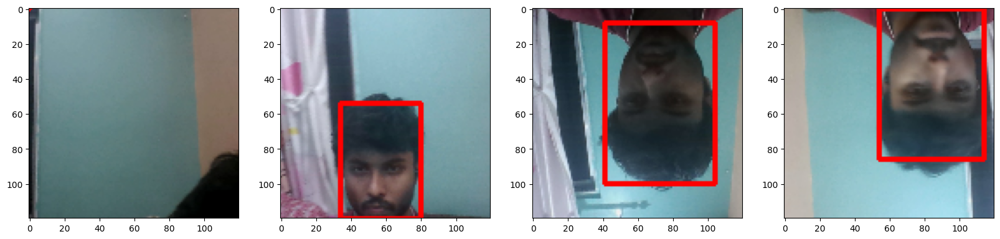

In [33]:
data_samples = train.as_numpy_iterator()
res = data_samples.next()

fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx in range(4): 
    sample_image = (res[0][idx]*255).astype(np.uint8).copy()
    sample_bboxes = res[1][1][idx]  # bboxes
    h, w = sample_image.shape[:2]
    for bbox in sample_bboxes:
        x_c, y_c, bw, bh = bbox
        x1 = int((x_c - bw/2) * w)
        y1 = int((y_c - bh/2) * h)
        x2 = int((x_c + bw/2) * w)
        y2 = int((y_c + bh/2) * h)
        cv2.rectangle(sample_image, (x1, y1), (x2, y2), (255,0,0), 2)
    ax[idx].imshow(sample_image)

# Model Training

In [1]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Dense, GlobalMaxPooling2D
from tensorflow.keras.applications import VGG16

In [2]:
vgg = VGG16(include_top=False)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 81s 1us/step


In [3]:
vgg.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

## Build Instance of Network

In [60]:
def build_model():
    input_layer = Input(shape=(120,120,3))
    vgg_features = VGG16(include_top=False)(input_layer)

    # Classification branch (face/no face)
    f1 = GlobalMaxPooling2D()(vgg_features)
    class1 = Dense(512, activation='relu')(f1)
    class2 = Dense(1, activation='sigmoid', name='class_output')(class1)

    # Bounding box branch ([x_center, y_center, width, height], all normalized)
    f2 = GlobalMaxPooling2D()(vgg_features)
    regress1 = Dense(512, activation='relu')(f2)
    regress2 = Dense(4, activation='sigmoid', name='bbox_output')(regress1)

    model = Model(inputs=input_layer, outputs=[class2, regress2])
    return model

facetracker = build_model()

In [34]:
train.as_numpy_iterator().next()

(array([[[[0.7206495 , 0.6657475 , 0.6226103 ],
          [0.7230392 , 0.66813725, 0.625     ],
          [0.7188113 , 0.6639093 , 0.62077206],
          ...,
          [0.7495098 , 0.74558824, 0.8004902 ],
          [0.73106617, 0.73743874, 0.7957721 ],
          [0.7264706 , 0.7269608 , 0.7882353 ]],
 
         [[0.7254902 , 0.67058825, 0.627451  ],
          [0.72156864, 0.6666667 , 0.62352943],
          [0.7215074 , 0.6666054 , 0.62346816],
          ...,
          [0.7528799 , 0.74895835, 0.8038603 ],
          [0.7278186 , 0.73290443, 0.7916667 ],
          [0.72683823, 0.72677696, 0.7882353 ]],
 
         [[0.7331495 , 0.66648287, 0.6272672 ],
          [0.73333335, 0.6666667 , 0.627451  ],
          [0.7259804 , 0.65931374, 0.62009805],
          ...,
          [0.74509805, 0.7411765 , 0.79607844],
          [0.73584557, 0.7333946 , 0.7946691 ],
          [0.72536767, 0.7214461 , 0.7841912 ]],
 
         ...,
 
         [[0.5495098 , 0.48284313, 0.42009804],
          [0.55894

## test the Network

In [61]:
facetracker = build_model()


In [62]:
facetracker.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)    │ (None, 120, 120, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ vgg16 (Functional)            │ (None, 3, 3, 512)         │      14,714,688 │ input_layer_5[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_max_pooling2d_4        │ (None, 512)               │               0 │ vgg16[0][0]                │
│ (GlobalMaxPooling2D)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_max_pooling2d_5        │ (None, 512)               │               0 │ vgg16[0][0]                │
│ (GlobalMaxPooling2D)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_6 (Dense)               │ (None, 512)               │         262,656 │ global_max_pooling2d_4[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_7 (Dense)               │ (None, 512)               │         262,656 │ global_max_pooling2d_5[0]… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ class_output (Dense)          │ (None, 1)                 │             513 │ dense_6[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bbox_output (Dense)           │ (None, 4)                 │           2,052 │ dense_7[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 15,242,565 (58.15 MB)

 Trainable params: 15,242,565 (58.15 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
X, y = train.as_numpy_iterator().next()

In [39]:
X.shape

(8, 120, 120, 3)

In [37]:
classes, coords = facetracker.predict(X)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [38]:
classes, coords

(array([[0.45946229],
        [0.51778936],
        [0.46904513],
        [0.37108785],
        [0.49906376],
        [0.4682263 ],
        [0.44463927],
        [0.476376  ]], dtype=float32),
 array([[0.414166  , 0.43022066, 0.5039984 , 0.57136697],
        [0.4568431 , 0.56518257, 0.46168238, 0.6214149 ],
        [0.47572416, 0.5709128 , 0.5394271 , 0.6199542 ],
        [0.4370962 , 0.58489174, 0.5078437 , 0.6363778 ],
        [0.4571114 , 0.54339516, 0.5229596 , 0.5706412 ],
        [0.41444942, 0.5642581 , 0.47235966, 0.5887283 ],
        [0.44690448, 0.4888115 , 0.5779202 , 0.62351644],
        [0.48287836, 0.5805645 , 0.5619091 , 0.6612718 ]], dtype=float32))

#  Define Losses and Optimizers

In [63]:
import tensorflow as tf
# Classification loss (binary crossentropy for presence/absence of face)
def classification_loss(y_true, y_pred):
    return tf.reduce_mean(tf.keras.losses.binary_crossentropy(y_true, y_pred))
# Localization loss (MSE for [x_center, y_center, width, height])
def localization_loss(y_true, y_pred):
    if len(y_true.shape) == 3:
        y_true = tf.squeeze(y_true, axis=1)
    if len(y_pred.shape) == 3:
        y_pred = tf.squeeze(y_pred, axis=1)
    return tf.reduce_mean(tf.square(y_true - y_pred))

In [64]:
facetracker.compile(
    optimizer='adam',
    loss={
        'class_output': classification_loss,
        'bbox_output': localization_loss
    },
    metrics={
        'class_output': 'accuracy',
        'bbox_output': 'mse'
    }
)

## Prepare batches for model


In [75]:
for item in train.take(1):
    print(type(item), len(item))
    print(type(item[0]), item[0].shape)  # imgs
    print(type(item[1]), len(item[1]))   # tuple (classes, bboxes)
    print(type(item[1][0]), item[1][0].shape)  # classes
    print(type(item[1][1]), item[1][1].shape)  # bboxes

<class 'tuple'> 2
<class 'tensorflow.python.framework.ops.EagerTensor'> (8, 120, 120, 3)
<class 'tuple'> 2
<class 'tensorflow.python.framework.ops.EagerTensor'> (8, 1)
<class 'tensorflow.python.framework.ops.EagerTensor'> (8, 1, 4)


In [76]:
for element in train.take(1):
    print(type(element))
    print(len(element))
    print([type(e) for e in element])

<class 'tuple'>
2
[<class 'tensorflow.python.framework.ops.EagerTensor'>, <class 'tuple'>]


In [77]:
for batch in train.take(1):
    print("Type:", type(batch))
    print("Length:", len(batch))
    print("First element type:", type(batch[0]))
    print("First element shape:", batch[0].shape)
    print("Second element type:", type(batch[1]))
    print("Second element length:", len(batch[1]))
    print("Class type:", type(batch[1][0]), "shape:", batch[1][0].shape)
    print("Bbox type:", type(batch[1][1]), "shape:", batch[1][1].shape)

Type: <class 'tuple'>
Length: 2
First element type: <class 'tensorflow.python.framework.ops.EagerTensor'>
First element shape: (8, 120, 120, 3)
Second element type: <class 'tuple'>
Second element length: 2
Class type: <class 'tensorflow.python.framework.ops.EagerTensor'> shape: (8, 1)
Bbox type: <class 'tensorflow.python.framework.ops.EagerTensor'> shape: (8, 1, 4)


In [108]:
def format_batch(*args):
    batch = args[-1]
    imgs = batch[0]
    classes = batch[1][0]        # (batch, 1), do NOT squeeze!
    bboxes = batch[1][1]         # (batch, 1, 4)
    bboxes = tf.squeeze(bboxes, axis=1)  # (batch, 4)
    return imgs, {'class_output': classes, 'bbox_output': bboxes}

In [109]:
train_fmt = train.map(format_batch)

In [110]:
val_fmt = val.map(format_batch)

In [111]:
test_fmt = test.map(format_batch)

## Train

In [112]:
for imgs, labels in train_fmt.take(1):
    print("IMAGES:")
    print("  type:", type(imgs))
    print("  shape:", getattr(imgs, "shape", "no shape"))

    print("\nLABELS:")
    print("  type:", type(labels))
    if isinstance(labels, dict):
        for k, v in labels.items():
            print(f"  key: {k} -> type: {type(v)}, shape: {getattr(v, 'shape', 'no shape')}")
    else:
        print("  value:", labels)

InvalidArgumentError: {{function_node __wrapped__IteratorGetNext_output_types_3_device_/job:localhost/replica:0/task:0/device:CPU:0}} Error in user-defined function passed to MapDataset:91 transformation with iterator: Iterator::Root::Prefetch::FiniteTake::ParallelMapV2: Can not squeeze dim[1], expected a dimension of 1, got 4
	 [[{{node Squeeze}}]] [Op:IteratorGetNext] name: 

In [113]:
history = facetracker.fit(
    train_fmt,
    validation_data=val_fmt,
    epochs=20
)

Epoch 1/20


ValueError: as_list() is not defined on an unknown TensorShape.

In [103]:
tf.keras.layers.Input(shape=(120, 120, 3))

<KerasTensor shape=(None, 120, 120, 3), dtype=float32, sparse=False, ragged=False, name=keras_tensor_151>